In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import keras
import tensorflow
import keras.backend as k
from keras.models import Sequential
from keras.layers import Dense, LSTM, Activation, Masking, Dropout
from tensorflow.keras.optimizers import RMSprop, Adam
#from keras.optimizers import adam
from keras.callbacks import History
from keras import callbacks

#Column Names
a = ['Unit Number', 'Time In Cycles']
b = [f'Operation Setting {x}' for x in range(1,4)]
c = [f'Sensor {i}' for i in range(1,22)]
Columns = a+b+c

In [2]:
# train dataset
df1 = pd.read_csv('train_FD001.txt', delim_whitespace = True, header = None)
df1.columns = Columns
print(df1.shape)
df1.head()

(20631, 26)


,Unit Number,Time In Cycles,Operation Setting 1,Operation Setting 2,Operation Setting 3,Sensor 1,Sensor 2,Sensor 3,Sensor 4,Sensor 5,...,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 16,Sensor 17,Sensor 18,Sensor 19,Sensor 20,Sensor 21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [3]:
# test dataset
df2 = pd.read_csv('test_FD001.txt', delim_whitespace = True, header = None)
df2.columns = Columns
print(df1.shape)
df2.head()

(20631, 26)


,Unit Number,Time In Cycles,Operation Setting 1,Operation Setting 2,Operation Setting 3,Sensor 1,Sensor 2,Sensor 3,Sensor 4,Sensor 5,...,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 16,Sensor 17,Sensor 18,Sensor 19,Sensor 20,Sensor 21
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130


In [4]:
pd.set_option('display.max_columns', None)
df1.describe(include = 'all')

,Unit Number,Time In Cycles,Operation Setting 1,Operation Setting 2,Operation Setting 3,Sensor 1,Sensor 2,Sensor 3,Sensor 4,Sensor 5,Sensor 6,Sensor 7,Sensor 8,Sensor 9,Sensor 10,Sensor 11,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 16,Sensor 17,Sensor 18,Sensor 19,Sensor 20,Sensor 21
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01,21.609803,553.367711,2388.096652,9065.242941,1.300000e+00,47.541168,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12,0.001389,0.885092,0.070985,22.082880,4.660829e-13,0.267087,0.737553,0.071919,19.076176,0.037505,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,21.600000,549.850000,2387.900000,9021.730000,1.300000e+00,46.850000,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01,21.610000,552.810000,2388.050000,9053.100000,1.300000e+00,47.350000,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,21.610000,553.440000,2388.090000,9060.660000,1.300000e+00,47.510000,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01,21.610000,554.010000,2388.140000,9069.420000,1.300000e+00,47.700000,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,21.610000,556.060000,2388.560000,9244.590000,1.300000e+00,48.530000,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400


In [5]:
df2.describe(include = 'all')

,Unit Number,Time In Cycles,Operation Setting 1,Operation Setting 2,Operation Setting 3,Sensor 1,Sensor 2,Sensor 3,Sensor 4,Sensor 5,Sensor 6,Sensor 7,Sensor 8,Sensor 9,Sensor 10,Sensor 11,Sensor 12,Sensor 13,Sensor 14,Sensor 15,Sensor 16,Sensor 17,Sensor 18,Sensor 19,Sensor 20,Sensor 21
count,13096.000000,13096.000000,13096.000000,13096.000000,13096.0,1.309600e+04,13096.000000,13096.000000,13096.000000,1.309600e+04,13096.000000,13096.000000,13096.000000,13096.000000,1.309600e+04,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,1.309600e+04,13096.000000,13096.0,13096.0,13096.000000,13096.000000
mean,51.543907,76.836515,-0.000011,0.000004,100.0,5.186700e+02,642.475088,1588.099204,1404.735362,1.462000e+01,21.609701,553.757523,2388.070964,9058.407363,1.300000e+00,47.416204,521.747724,2388.071025,8138.947817,8.425844,3.000000e-02,392.571625,2388.0,100.0,38.892502,23.335743
std,28.289423,53.057749,0.002203,0.000294,0.0,6.014263e-11,0.400899,5.003274,6.688309,2.671743e-12,0.001704,0.681286,0.057442,11.436261,3.157595e-13,0.195917,0.559627,0.056934,10.188605,0.029009,8.823140e-15,1.233577,0.0,0.0,0.141681,0.084120
min,1.000000,1.000000,-0.008200,-0.000600,100.0,5.186700e+02,641.130000,1569.040000,1384.390000,1.462000e+01,21.600000,550.880000,2387.890000,9024.530000,1.300000e+00,46.800000,519.380000,2387.890000,8108.500000,8.332800,3.000000e-02,389.000000,2388.0,100.0,38.310000,22.935400
25%,28.000000,33.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.197500,1584.600000,1399.950000,1.462000e+01,21.610000,553.310000,2388.030000,9051.020000,1.300000e+00,47.270000,521.380000,2388.030000,8132.310000,8.405600,3.000000e-02,392.000000,2388.0,100.0,38.800000,23.281600
50%,52.000000,69.000000,0.000000,0.000000,100.0,5.186700e+02,642.460000,1587.990000,1404.440000,1.462000e+01,21.610000,553.800000,2388.070000,9057.320000,1.300000e+00,47.410000,521.780000,2388.070000,8138.390000,8.424900,3.000000e-02,393.000000,2388.0,100.0,38.900000,23.339200
75%,76.000000,113.000000,0.001500,0.000300,100.0,5.186700e+02,642.740000,1591.362500,1409.050000,1.462000e+01,21.610000,554.240000,2388.110000,9064.110000,1.300000e+00,47.540000,522.150000,2388.110000,8144.360000,8.444300,3.000000e-02,393.000000,2388.0,100.0,38.990000,23.393600
max,100.000000,303.000000,0.007800,0.000700,100.0,5.186700e+02,644.300000,1607.550000,1433.360000,1.462000e+01,21.610000,555.840000,2388.300000,9155.030000,1.300000e+00,48.260000,523.760000,2388.320000,8220.480000,8.541400,3.000000e-02,397.000000,2388.0,100.0,39.410000,23.641900


In [6]:
df1.isnull().sum()

Unit Number            0
Time In Cycles         0
Operation Setting 1    0
Operation Setting 2    0
Operation Setting 3    0
Sensor 1               0
Sensor 2               0
Sensor 3               0
Sensor 4               0
Sensor 5               0
Sensor 6               0
Sensor 7               0
Sensor 8               0
Sensor 9               0
Sensor 10              0
Sensor 11              0
Sensor 12              0
Sensor 13              0
Sensor 14              0
Sensor 15              0
Sensor 16              0
Sensor 17              0
Sensor 18              0
Sensor 19              0
Sensor 20              0
Sensor 21              0
dtype: int64

In [7]:
df2.isnull().sum()

Unit Number            0
Time In Cycles         0
Operation Setting 1    0
Operation Setting 2    0
Operation Setting 3    0
Sensor 1               0
Sensor 2               0
Sensor 3               0
Sensor 4               0
Sensor 5               0
Sensor 6               0
Sensor 7               0
Sensor 8               0
Sensor 9               0
Sensor 10              0
Sensor 11              0
Sensor 12              0
Sensor 13              0
Sensor 14              0
Sensor 15              0
Sensor 16              0
Sensor 17              0
Sensor 18              0
Sensor 19              0
Sensor 20              0
Sensor 21              0
dtype: int64

In [8]:
# Life of all 100 units of train set

pd.set_option('display.max_rows', None)
print(df1.groupby('Unit Number')['Time In Cycles'].max())
pd.set_option('display.max_rows', 15)

Unit Number
1      192
2      287
3      179
4      189
5      269
6      188
7      259
8      150
9      201
10     222
11     240
12     170
13     163
14     180
15     207
16     209
17     276
18     195
19     158
20     234
21     195
22     202
23     168
24     147
25     230
26     199
27     156
28     165
29     163
30     194
31     234
32     191
33     200
34     195
35     181
36     158
37     170
38     194
39     128
40     188
41     216
42     196
43     207
44     192
45     158
46     256
47     214
48     231
49     215
50     198
51     213
52     213
53     195
54     257
55     193
56     275
57     137
58     147
59     231
60     172
61     185
62     180
63     174
64     283
65     153
66     202
67     313
68     199
69     362
70     137
71     208
72     213
73     213
74     166
75     229
76     210
77     154
78     231
79     199
80     185
81     240
82     214
83     293
84     267
85     188
86     278
87     178
88     213
89     217
90     15

# Adding the dependent variable RUL

In [9]:
# Dependent variable for TRAIN set

# list of Life of all 100 units of train set
max_cycle_df1 = df1.groupby('Unit Number')['Time In Cycles'].max()

'''
The purpose of this code is to make our dependent variable

Line1 : Declare an empty list
Line2 : for loop for going through the maximum cycles of each unit
Line3 : for loop for iterating through each row of the dataset
Line4 : if statement for checking equality to match each unit's max. cycle with it's unit
Line5 : adding value of RUL for that unit to the empty list for that instance
Line6 : else if statement to break the inner for loop if inner for loop has moved on to the next unit
'''
RUL = []
for index,rul in enumerate(max_cycle_df1):
    for i in range(df1.shape[0]):
        if df1.iloc[i,0] == (index+1):
            RUL.append(rul-df1.iloc[i,1])
        elif df1.iloc[i,0] == (index+2):
            break
df1['RUL'] = RUL            

In [10]:
from numpy import loadtxt

# Dependent Variable for Test Set

In [11]:
y_test = pd.read_csv('RUL_FD001.txt', delim_whitespace=True,names=["RUL"])
y_test["UnitNumber"] = y_test.index

# Exploratory Data Analysis

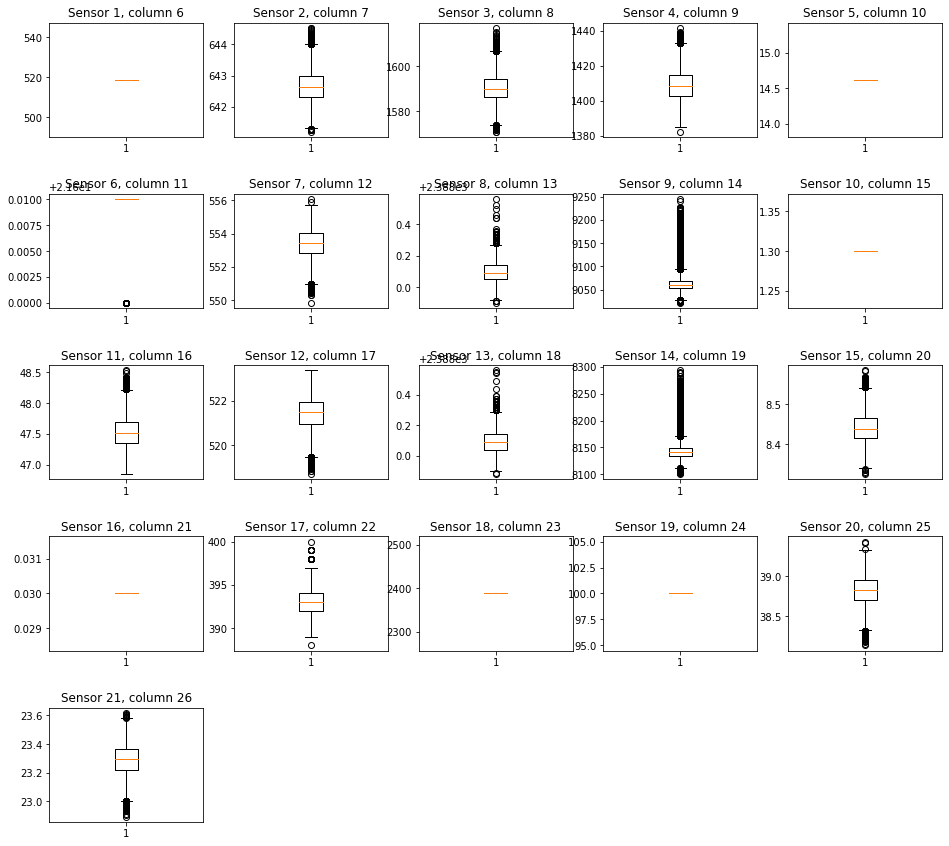

In [12]:
plt.figure(figsize = (16, 21))

for i in range(21):
    temp_data = df1.iloc[:,i+5]
    plt.subplot(7,5,i+1)
    plt.boxplot(temp_data)
    plt.title(df1.columns[i+5] + ", column "+ str(i+6))
plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()
#plt.savefig('boxplot.png')

Based on above plots you can see that sensor 1,5,6,10,16,18 & 19 have constant values. So they will be dropped


In [13]:
df1.drop(['Operation Setting 1','Operation Setting 2','Operation Setting 3',
          'Sensor 1','Sensor 5','Sensor 6','Sensor 16','Sensor 10','Sensor 18','Sensor 19'], axis = 1, inplace = True)
df2.drop(['Operation Setting 1','Operation Setting 2','Operation Setting 3',
          'Sensor 1','Sensor 5','Sensor 6','Sensor 16','Sensor 10','Sensor 18','Sensor 19'], axis = 1, inplace = True)

So we have the following sensors left 2,3,4,7,8,9,11,12,13,14,15,16,17,20,21 <br>
Step 2 will be to make a scatter plot for each of them and remove outliers 

In [14]:
df1.columns

Index(['Unit Number', 'Time In Cycles', 'Sensor 2', 'Sensor 3', 'Sensor 4',
       'Sensor 7', 'Sensor 8', 'Sensor 9', 'Sensor 11', 'Sensor 12',
       'Sensor 13', 'Sensor 14', 'Sensor 15', 'Sensor 17', 'Sensor 20',
       'Sensor 21', 'RUL'],
      dtype='object')

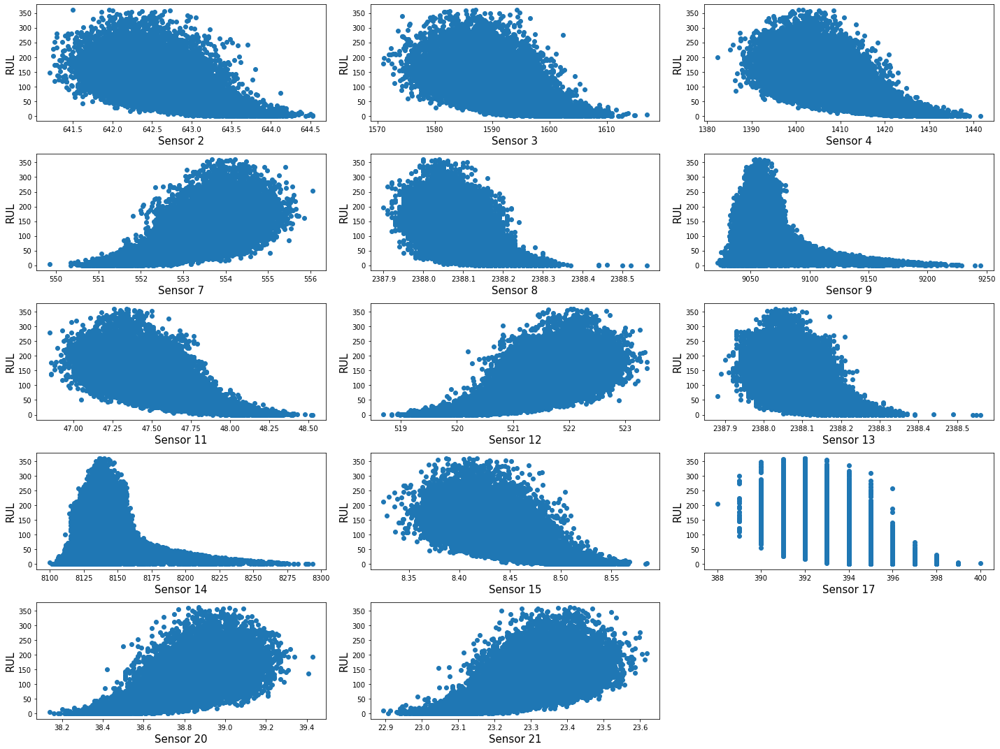

In [15]:
plt.figure(figsize = (20,15))
sensor = df1.drop(['Unit Number', 'RUL', 'Time In Cycles'], axis = 1).columns
for index, i in enumerate(sensor):
    plt.subplot(5,3,index+1)
    plt.scatter(df1[i], df1['RUL'])
    plt.xlabel(str(i), fontsize = 15)
    plt.ylabel('RUL', fontsize = 15)
plt.tight_layout()    


In [16]:
import warnings
warnings.filterwarnings("ignore")

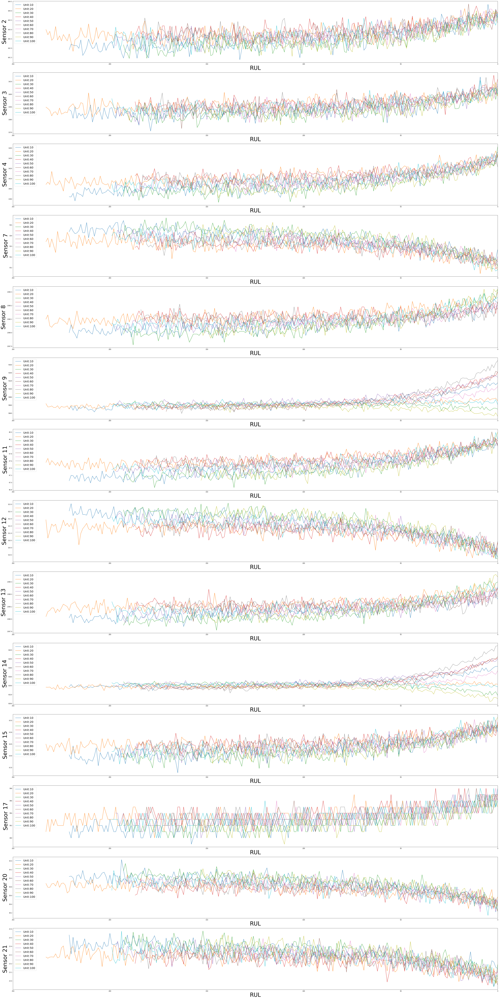

In [17]:
'''
The goal of this cell is to display the values of sensors against the value of RUL(x-axis, decreasing)
'''

plt.figure(figsize= (50,100))

for unit in df1['Unit Number'].unique():
    if unit%10 == 0:
        temp = df1[df1['Unit Number'] == unit]
        for index, i in enumerate(sensor):
            plt.subplot(14,1,index+1)
            plt.plot(temp['RUL'],temp[i], label = f'Unit:{unit}')
            plt.xlim(250,0)
            plt.xlabel('RUL', fontsize = 40)
            plt.ylabel(str(i), fontsize = 40)
            plt.legend(fontsize = 20)

plt.tight_layout()


Also sensor 9 and 14 can also be dropped due to their spread

In [18]:
for i in (df1,df2):
    i.drop(['Sensor 9', 'Sensor 14'], axis = 1, inplace = True)

In [19]:
for i in (df1,df2):
    i.drop(['Time In Cycles'], axis = 1, inplace = True)

# Normalizing The Data

In [21]:
feats = df1.drop(['Unit Number', 'RUL'], axis = 1).columns

In [22]:
from sklearn.preprocessing import MinMaxScaler #to normalize data

In [23]:
min_max_scaler = MinMaxScaler(feature_range=(0,1))

df1[feats] = min_max_scaler.fit_transform(df1[feats])
df2[feats] = min_max_scaler.fit_transform(df2[feats])

In [24]:
def gen_train(id_df, seq_length, seq_cols):
    """
        function to prepare train data into (samples, time steps, features)
        id_df = train dataframe
        seq_length = look back period
        seq_cols = feature columns
    """
        
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    lstm_array=[]
    
    for start, stop in zip(range(0, num_elements-seq_length+1), range(seq_length, num_elements+1)):
        lstm_array.append(data_array[start:stop, :])
    
    return np.array(lstm_array)

In [25]:
def gen_target(id_df, seq_length, label):
    data_array = id_df[label].values
    num_elements = data_array.shape[0]
    return data_array[seq_length-1:num_elements+1]

In [26]:
def gen_test(id_df, seq_length, seq_cols, mask_value):
    """
        function to prepare test data into (samples, time steps, features)
        function only returns last sequence of data for every unit
        id_df = test dataframe
        seq_length = look back period
        seq_cols = feature columns
    """
    df_mask = pd.DataFrame(np.zeros((seq_length-1,id_df.shape[1])),columns=id_df.columns)
    df_mask[:] = mask_value
    
    id_df = df_mask.append(id_df,ignore_index=True)
    
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    lstm_array=[]
    
    start = num_elements-seq_length
    stop = num_elements
    
    lstm_array.append(data_array[start:stop, :])
    
    return np.array(lstm_array)

In [45]:
sequence_length = 30
mask_value = 0

In [46]:
#generate train
x_train=np.concatenate(list(list(gen_train(df1[df1['Unit Number']==unit], sequence_length, feats)) for unit in df1['Unit Number'].unique()))
print(x_train.shape)

(17731, 30, 12)


In [47]:
#generate target of train
y_train = np.concatenate(list(list(gen_target(df1[df1['Unit Number']==unit], sequence_length, "RUL")) for unit in df1['Unit Number'].unique()))
y_train.shape

(17731,)

In [48]:
#generate test
x_test=np.concatenate(list(list(gen_test(df2[df2['Unit Number']==unit], sequence_length, feats, mask_value)) for unit in df2['Unit Number'].unique()))
print(x_test.shape)

(100, 30, 12)


In [ ]:
y_test = y_test.RUL.values
y_test.shape

# LSTM Model

In [50]:
nb_features = x_train.shape[2]
nb_out = 1

In [51]:
nb_features

12

In [52]:
history = History()

model = Sequential()
model.add(LSTM(
         units=100,
         return_sequences=True,
         input_shape=(sequence_length, nb_features)))
model.add(Dropout(0.2))
model.add(LSTM(
          units=100,
          return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(units=1, activation='relu'))
model.add(Activation("relu"))
model.compile(loss="mse", optimizer="rmsprop", metrics=['mse'])

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 30, 100)           45200     
_________________________________________________________________
dropout_6 (Dropout)          (None, 30, 100)           0         
_________________________________________________________________
lstm_7 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dropout_7 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 101       
_________________________________________________________________
activation_3 (Activation)    (None, 1)                 0         
Total params: 125,701
Trainable params: 125,701
Non-trainable params: 0
________________________________________________

In [53]:
%%time
# fit the model
model.fit(x_train, y_train, epochs=100, batch_size=32, validation_split=0.1, verbose=1,
          callbacks = [history, keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=0, mode='auto')])

Epoch 1/100
499/499 [==============================] - 17s 27ms/step - loss: 8491.6485 - mse: 8491.6485 - val_loss: 7135.3965 - val_mse: 7135.3965
Epoch 2/100
499/499 [==============================] - 13s 25ms/step - loss: 4288.6205 - mse: 4288.6205 - val_loss: 4091.0005 - val_mse: 4091.0005
Epoch 3/100
499/499 [==============================] - 13s 26ms/step - loss: 2197.3557 - mse: 2197.3557 - val_loss: 2499.0615 - val_mse: 2499.0615
Epoch 4/100
499/499 [==============================] - 13s 26ms/step - loss: 1320.7421 - mse: 1320.7421 - val_loss: 2387.3381 - val_mse: 2387.3381
Epoch 5/100
499/499 [==============================] - 13s 26ms/step - loss: 1170.6691 - mse: 1170.6691 - val_loss: 1948.0922 - val_mse: 1948.0922
Epoch 6/100
499/499 [==============================] - 14s 28ms/step - loss: 1151.3672 - mse: 1151.3672 - val_loss: 1924.0059 - val_mse: 1924.0059
Epoch 7/100
499/499 [==============================] - 15s 29ms/step - loss: 1017.3018 - mse: 1017.3018 - val_loss: 14

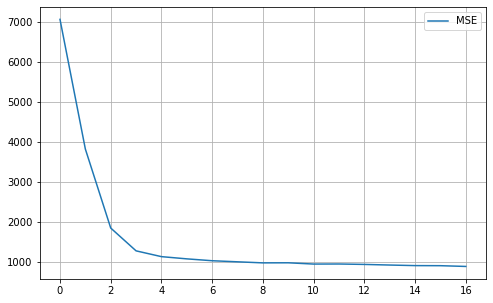

In [56]:
pd.DataFrame(history.history['mse']).plot(figsize=(8,5))
plt.legend(['MSE'])
plt.grid(True)
plt.gca()
plt.show()

In [55]:
model.evaluate(x_test,y_test)

4/4 [==============================] - 0s 8ms/step - loss: 1180.9187 - mse: 1180.9187


[1180.918701171875, 1180.918701171875]